# **FloraSense - Deep Learning for Crop Illness Analysis**
## CSCI 5931 Deep Learning
## Sai Srikar Emani
### 110828121 | saisrikar.emani@ucdenver.edu

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'florasensedata:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4961530%2F8350864%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240507%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240507T220230Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D0a8f1b5d5761d8c8a63e01d20f85297ddead50eff70818b046e9abeb011de6ff5945694c8bf1abeba2be809eef8a6c39694ac522eaa3094d482a179ed925f51cfdf910f2a65b2ce00725d43fecfbb7647a3ebd67c0453c942cccdc02ee65e6647ad16841ab18f3ed23926860ed7eff08e547b6678b1829145be5cbb96473ee68a86762029f477f3d943e70aa952d91513b6f6bd7a6f6b65c200b3b9a1bb2fd025664b28182a8d767d7428dabf726a117d825c0ea23e9b81055256c1fa2d614b21da8d1e93e51e2b2f6c959ccc33ed2790617c90ecd5fc31c8b7a8adfe5e3c13533478e580d444595b5ddac8f666699b2f294dbc123b0acbe03bc26518b1127d9'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 1436629164 bytes downloaded
Downloaded and uncompressed: florasensedata
Data source import complete.


## Environment Setup

In [ ]:
# Step 1: Set up GPU usage
import tensorflow as tf

# Check if GPU is available and set TensorFlow device to GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

# Import necessary libraries
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Dropout, Flatten
from tensorflow.keras.applications import ResNet50, InceptionV3
import matplotlib.pyplot as plt

# Print TensorFlow version to confirm setup
print('TensorFlow version:', tf.__version__)

# Step 2: Set up directories for dataset (adjust paths as needed)
import os

# Define individual paths for training, validation, and test data
train_dir = '/kaggle/input/florasensedata/Data/train'
validation_dir = '/kaggle/input/florasensedata/Data/valid'
test_dir = '/kaggle/input/florasensedata/Data/test'

# Check if directories exist, to prevent errors during training
if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(validation_dir):
    os.makedirs(validation_dir)
if not os.path.exists(test_dir):
    os.makedirs(test_dir)

print("Environment setup complete. Ready to proceed with the project!")

Found GPU at: /device:GPU:0
TensorFlow version: 2.15.0
Environment setup complete. Ready to proceed with the project!


## Data Loading and Preprocessing

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/kaggle/input/florasensedata/Data/train'
validation_dir = '/kaggle/input/florasensedata/Data/valid'

# Set the image size
image_size = (256, 256)

# Initialize ImageDataGenerator for training data with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0,1]
    rotation_range=40,  # Random rotation between 0 and 40 degrees
    width_shift_range=0.2,  # Random horizontal shift
    height_shift_range=0.2,  # Random vertical shift
    shear_range=0.2,  # Shear transformations
    zoom_range=0.2,  # Random zoom
    horizontal_flip=True,  # Random horizontal flipping
    fill_mode='nearest'  # Strategy for filling newly created pixels
)

# Initialize ImageDataGenerator for validation data (only rescaling)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Set up the train and validation generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=32,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=image_size,
    batch_size=32,
    class_mode='categorical'
)

print("Data generators are set up and ready to feed data into the model!")

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.
Data generators are set up and ready to feed data into the model!


## Exploratory Data Analysis

Apple___Apple_scab: 2016 images
Apple___Black_rot: 1987 images
Apple___Cedar_apple_rust: 1760 images
Apple___healthy: 2008 images
Blueberry___healthy: 1816 images
Cherry_(including_sour)___Powdery_mildew: 1683 images
Cherry_(including_sour)___healthy: 1826 images
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 images
Corn_(maize)___Common_rust_: 1907 images
Corn_(maize)___Northern_Leaf_Blight: 1908 images
Corn_(maize)___healthy: 1859 images
Grape___Black_rot: 1888 images
Grape___Esca_(Black_Measles): 1920 images
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722 images
Grape___healthy: 1692 images
Orange___Haunglongbing_(Citrus_greening): 2010 images
Peach___Bacterial_spot: 1838 images
Peach___healthy: 1728 images
Pepper,_bell___Bacterial_spot: 1913 images
Pepper,_bell___healthy: 1988 images
Potato___Early_blight: 1939 images
Potato___Late_blight: 1939 images
Potato___healthy: 1824 images
Raspberry___healthy: 1781 images
Soybean___healthy: 2022 images
Squash___Powdery_mildew: 17

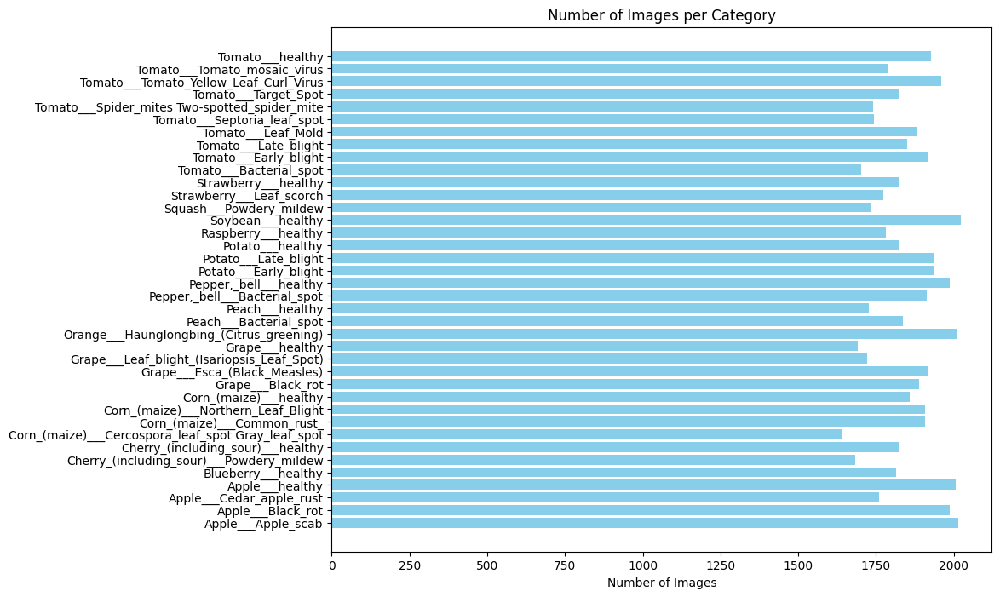

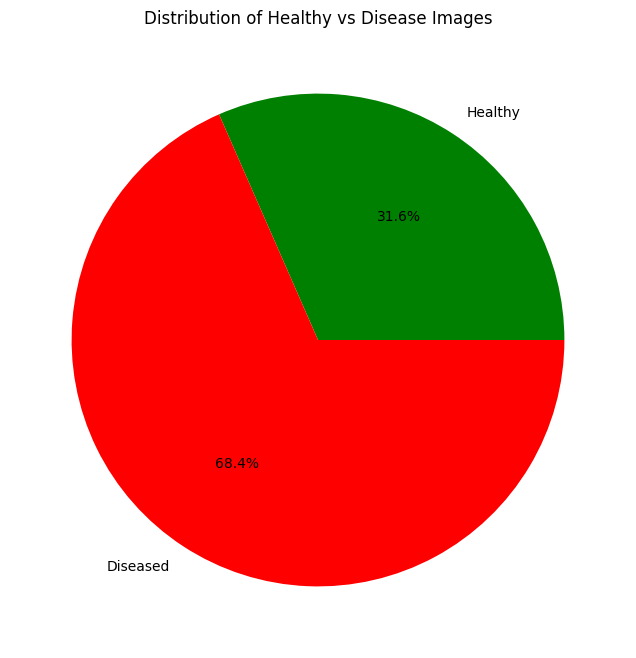

<ipython-input-5-6f18d717d7e8>:51: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



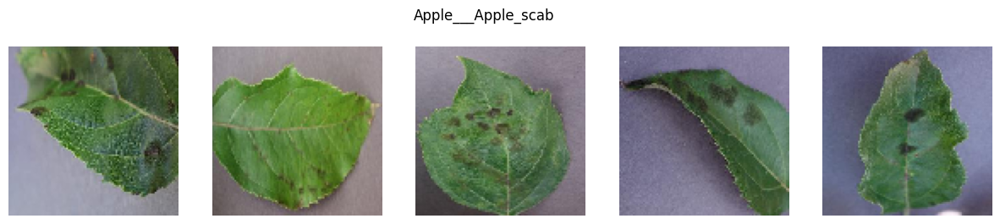

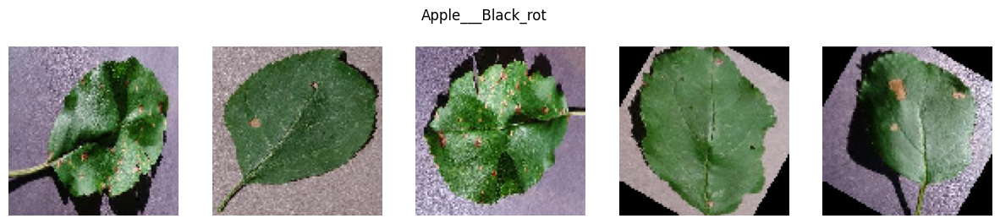

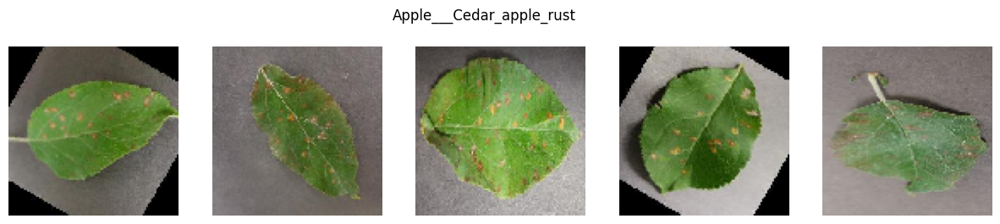

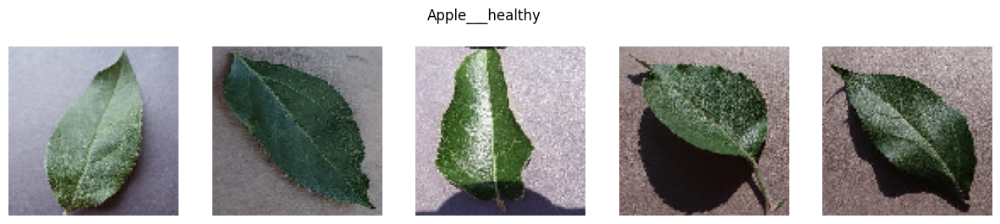

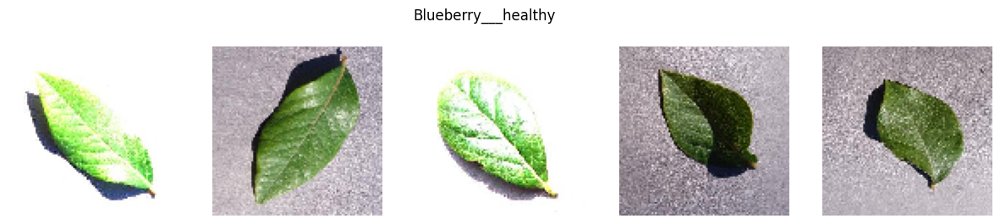

...

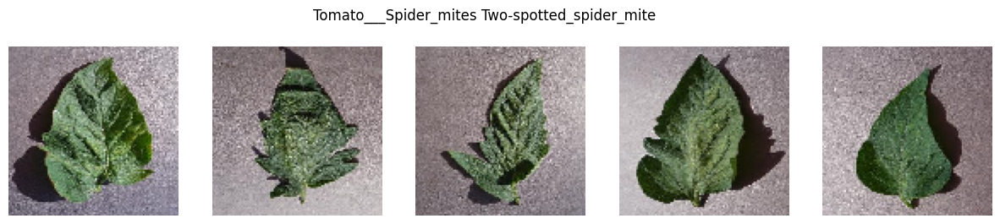

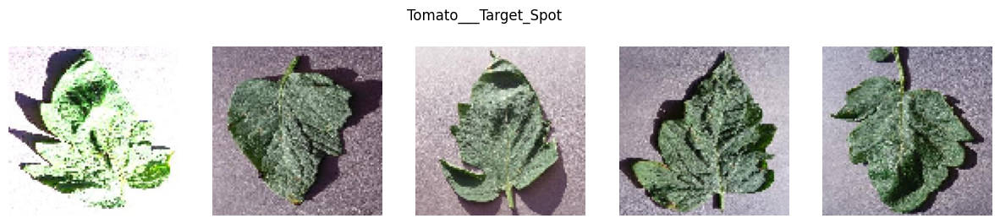

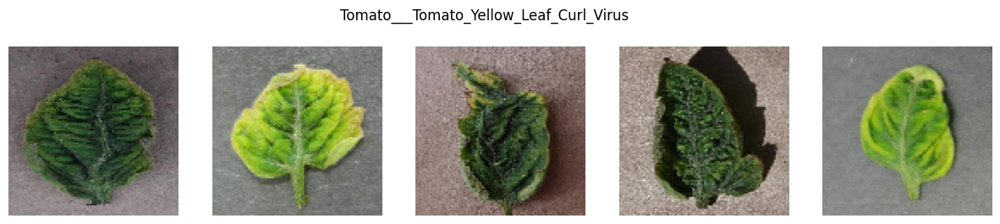

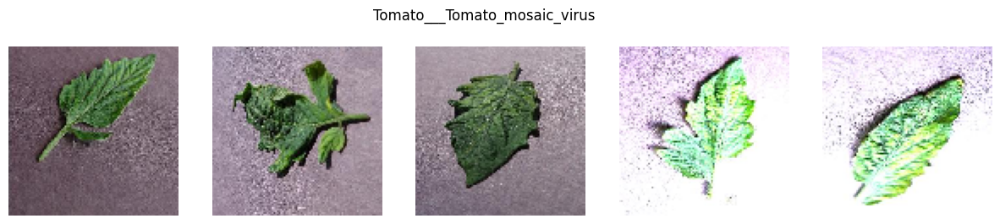

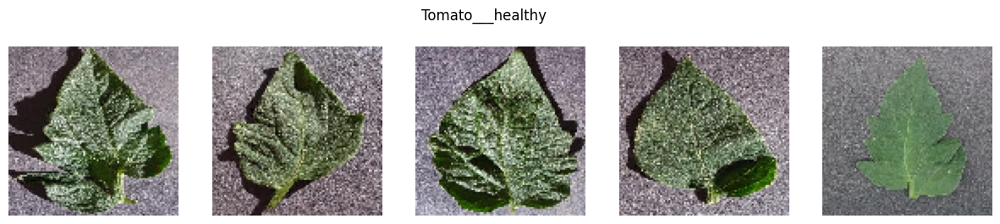

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
import plotly.express as px
import pandas as pd

train_dir = '/kaggle/input/florasensedata/Data/train'

# Get list of categories and their paths
categories = sorted(os.listdir(train_dir))
categories_paths = [os.path.join(train_dir, cat) for cat in categories]

# Count the number of images per category
category_image_counts = {category: len(os.listdir(path)) for category, path in zip(categories, categories_paths)}

# Print number of images in each class
for category, count in category_image_counts.items():
    print(f"{category}: {count} images")

# Visualize the number of images per category using a bar chart
plt.figure(figsize=(10, 8))
plt.barh(list(category_image_counts.keys()), list(category_image_counts.values()), color='skyblue')
plt.xlabel('Number of Images')
plt.title('Number of Images per Category')
plt.show()

# Create a pie chart for distribution of healthy vs disease images
healthy = sum('healthy' in category for category in categories)
diseased = len(categories) - healthy
plt.figure(figsize=(8, 8))
plt.pie([healthy, diseased], labels=['Healthy', 'Diseased'], autopct='%1.1f%%', colors=['green', 'red'])
plt.title('Distribution of Healthy vs Disease Images')
plt.show()

# Sunburst chart for plant categories and diseases
sunburst_data = []
for category in categories:
    parts = category.split('___')
    if len(parts) > 1:
        sunburst_data.append({'plant': parts[0], 'condition': parts[1], 'value': category_image_counts[category]})

sunburst_df = pd.DataFrame(sunburst_data)
fig = px.sunburst(sunburst_df, path=['plant', 'condition'], values='value', title='Plant Conditions Distribution')
fig.show()

# Display a few images from each category
num_images_to_show = 5
for category in categories:
    fig, axs = plt.subplots(1, num_images_to_show, figsize=(15, 3))
    fig.suptitle(category)
    files = os.listdir(os.path.join(train_dir, category))
    for i in range(num_images_to_show):
        img_path = os.path.join(train_dir, category, files[i])
        img = load_img(img_path, target_size=(100, 100))
        axs[i].imshow(img)
        axs[i].axis('off')
plt.show()

## Model Building

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Concatenate, BatchNormalization
from tensorflow.keras.applications import ResNet50, InceptionV3
from tensorflow.keras.optimizers import Adam

# Ensure TensorFlow is using the GPU
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Load pre-trained ResNet50 and InceptionV3 models without the top layer
base_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Freeze the layers of the pre-trained models to prevent them from being updated during training
for layer in base_resnet.layers:
    layer.trainable = False
for layer in base_inception.layers:
    layer.trainable = False

# Define the input layer
input_layer = Input(shape=(256, 256, 3))

# Use the pre-trained models as feature extractors
resnet_features = base_resnet(input_layer)
inception_features = base_inception(input_layer)

# Flatten the output of both pre-trained models
flattened_resnet = Flatten()(resnet_features)
flattened_inception = Flatten()(inception_features)

# Concatenate the features from both models
concatenated_features = Concatenate()([flattened_resnet, flattened_inception])

# Introduce a Batch Normalization layer after concatenation to stabilize the learning process
bn_layer = BatchNormalization()(concatenated_features)

# Add a fully connected layer
dense_layer = Dense(512, activation='relu')(bn_layer)

# Add a Batch Normalization layer after the dense layer
bn_layer_2 = BatchNormalization()(dense_layer)

# Introduce dropout for regularization to reduce overfitting
dropout_layer = Dropout(0.3)(bn_layer_2)

# Define the output layer with softmax activation function for multi-class classification
output_layer = Dense(38, activation='softmax')(dropout_layer)

# Construct the final model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model with the Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary to verify the architecture
model.summary()

Num GPUs Available:  1
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 resnet50 (Functional)       (None, 8, 8, 2048)           2358771   ['input_6[0][0]']             
                                                          2                                       
                                                                                                  
 inception_v3 (Functional)   (None, 6, 6, 2048)           2180278   ['input_6[0][0]']             
                                                          4                                       
                                                                     

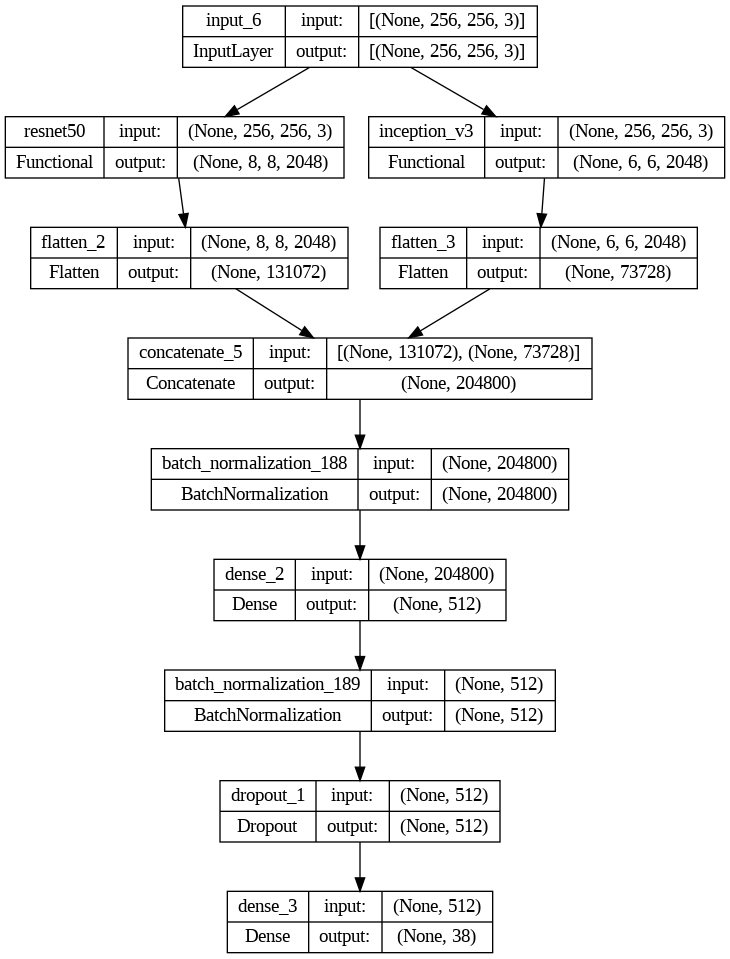

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model

# Plot the model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

from IPython.display import Image
Image(filename='model_plot.png')

## Model Training

Num GPUs Available:  1
TensorFlow will automatically use the GPU when available
Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.
Epoch 1/30
1098/1098 [==============================] - ETA: 0s - loss: 0.5930 - accuracy: 0.8251
Epoch 1: val_accuracy improved from -inf to 0.89981, saving model to /content/drive/MyDrive/DL Project/best_model.h5
1098/1098 [==============================] - 1038s 938ms/step - loss: 0.5930 - accuracy: 0.8251 - val_loss: 0.3146 - val_accuracy: 0.8998 - lr: 1.0000e-04
Epoch 2/30
1098/1098 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.8974
Epoch 2: val_accuracy improved from 0.89981 to 0.92068, saving model to /content/drive/MyDrive/DL Project/best_model.h5
1098/1098 [==============================] - 1034s 942ms/step - loss: 0.3237 - accuracy: 0.8974 - val_loss: 0.2447 - val_accuracy: 0.9207 - lr: 1.0000e-04
Epoch 3/30
1098/1098 [==============================] - ETA: 0s - loss: 0.2665 - accuracy

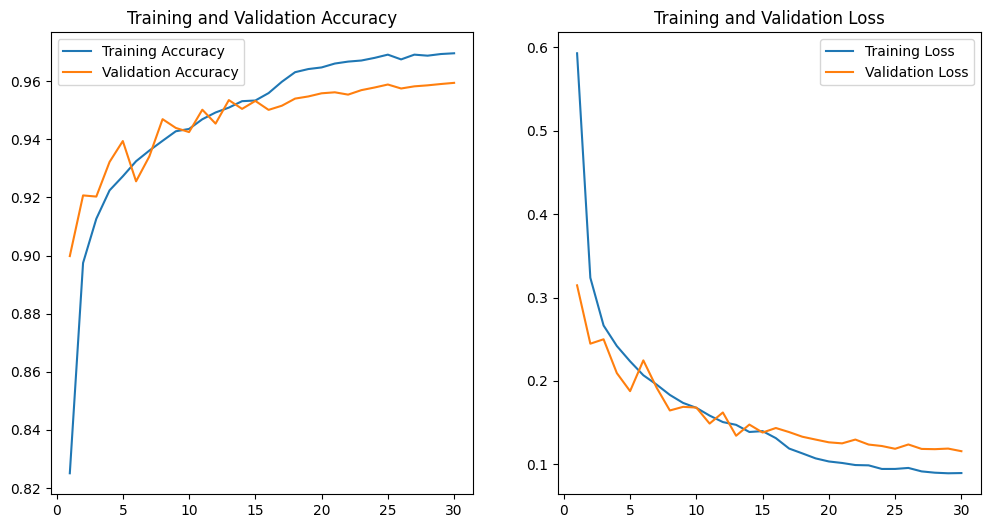

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Check if GPU is available and configure TensorFlow to use it
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("TensorFlow will automatically use the GPU when available")
else:
    print("No GPU found! TensorFlow will use CPU instead.")

train_dir = '/kaggle/input/florasensedata/Data/train'
validation_dir = '/kaggle/input/florasensedata/Data/valid'

# Configure training parameters
batch_size = 64  # Defines the number of samples that will be propagated through the network in one pass.
epochs = 30      # Number of times the entire dataset is passed forward and backward through the neural network.
learning_rate = 0.00005  # Step size used by the optimizer to adjust the weights.

image_size = (256, 256)

# Initialize data generators with image augmentation techniques for training
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Initialize data generators without image augmentation for validation (only rescaling)
validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

# Prepare iterators to process and batch data from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Configure model checkpoints to save the best model during training
checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/DL Project/best_model.h5',
    verbose=1,
    save_best_only=True,
    mode='auto'
)

# Configure early stopping to terminate training if validation loss ceases to decrease
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1,
    restore_best_weights=True
)

# Configure learning rate reduction to decrease the learning rate when a plateau in validation loss is detected
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    verbose=1,
    min_delta=0.0001,
    min_lr=1e-7
)

# Start the training process
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr],
    verbose=1
)

# Function to plot training and validation accuracy and losses
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    plt.show()

# Call the function to plot training and validation metrics
plot_training_history(history)


## Model Evaluation

Found 17572 images belonging to 38 classes.
275/275 [==============================] - 38s 128ms/step - loss: 0.1156 - accuracy: 0.9594
Validation Loss: 0.11561963707208633
Validation Accuracy: 0.9594240784645081
275/275 [==============================] - 38s 128ms/step
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.95      0.97       504
                                 Apple___Black_rot       0.99      0.99      0.99       497
                          Apple___Cedar_apple_rust       1.00      1.00      1.00       440
                                   Apple___healthy       0.97      0.98      0.98       502
                               Blueberry___healthy       0.96      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99   

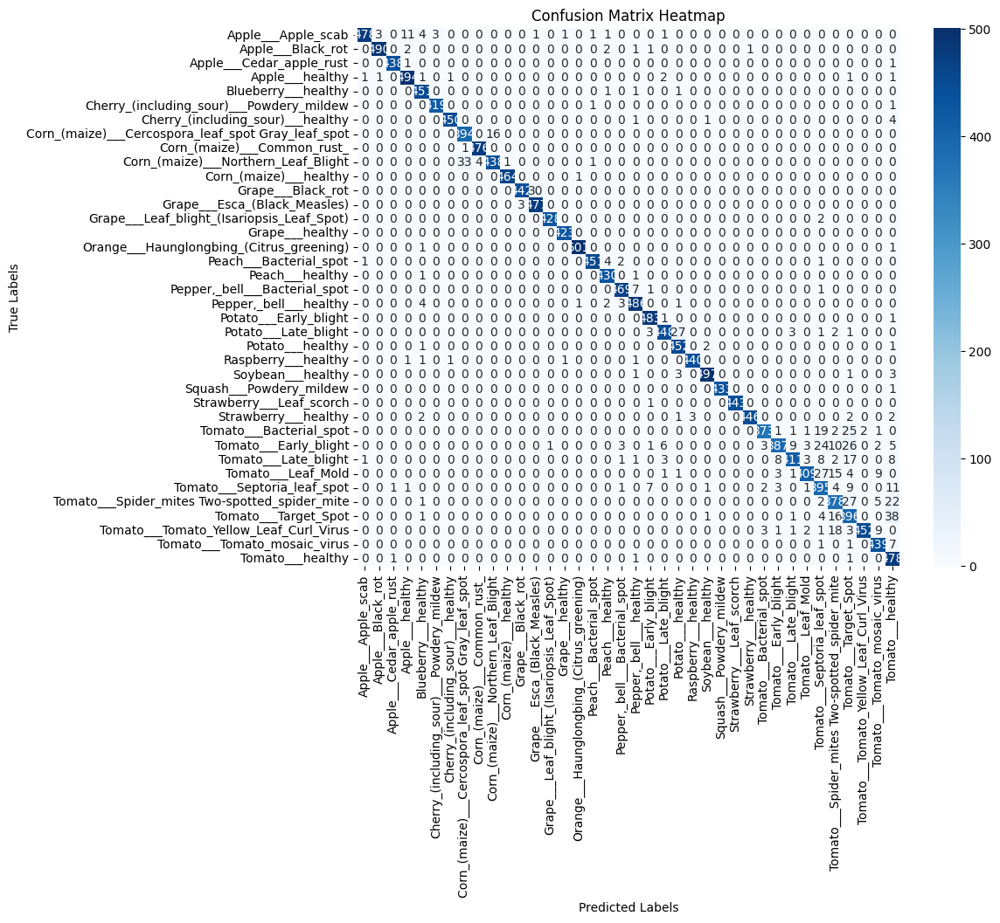

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the model
model_path = '/content/drive/MyDrive/DL Project/best_model.h5'
model = load_model(model_path)

validation_dir = '/kaggle/input/florasensedata/Data/valid'

# Prepare your data generator for evaluation (no augmentation here)
validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='categorical',
    shuffle=False  # Important: do not shuffle data for evaluation to keep labels aligned with predictions
)

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(validation_generator, verbose=1)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

# Predict the labels on the validation dataset
predictions = model.predict(validation_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Retrieve true labels from the generator
true_classes = validation_generator.classes
class_labels = list(validation_generator.class_indices.keys())  # Get the list of class labels

# Generate a classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

# Generate a confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)
print("Confusion Matrix:")
print(conf_matrix)

# Plotting the confusion matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix Heatmap')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

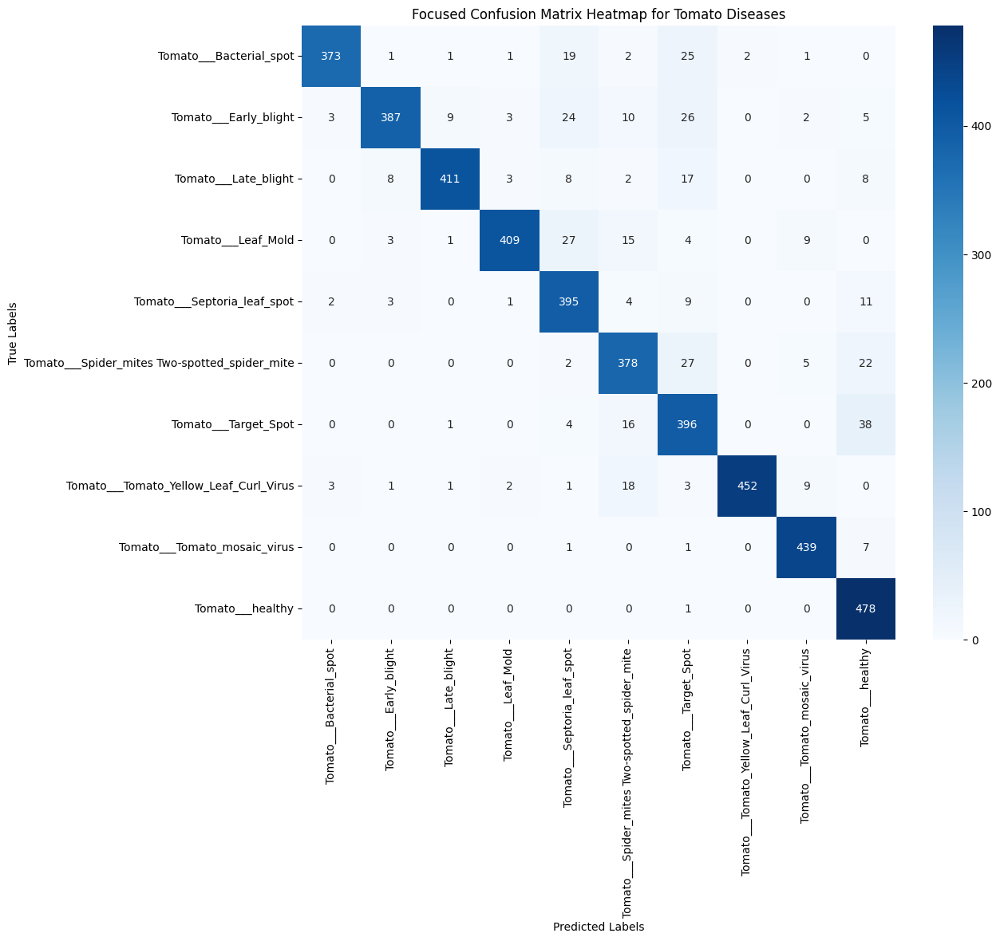

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Smaller subset or specific focus area
focus_classes_indices = [i for i, label in enumerate(class_labels) if 'Tomato' in label]  # Example: Focus on Tomato-related classes
conf_matrix_focus = conf_matrix[focus_classes_indices][:, focus_classes_indices]
labels_focus = [class_labels[idx] for idx in focus_classes_indices]

plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix_focus, annot=True, fmt='d', cmap='Blues', xticklabels=labels_focus, yticklabels=labels_focus)
plt.title('Focused Confusion Matrix Heatmap for Tomato Diseases')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

## Predictions on Test Set

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import os

# Load the trained model
model_path = '/content/drive/MyDrive/DL Project/best_model.h5'
model = load_model(model_path)

# Define the path to test dataset directory
test_dir = '/kaggle/input/florasensedata/Data/test'

# Create a DataFrame containing paths to images
# os.listdir will list the files in the directory
image_paths = [os.path.join(test_dir, fname) for fname in os.listdir(test_dir)]
test_df = pd.DataFrame({
    'filename': image_paths
})

# Prepare the data generator for the test set
test_datagen = ImageDataGenerator(rescale=1./255)

# Create a test generator using flow_from_dataframe
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col=None,  # No target column as there are no labels
    target_size=(256, 256),
    color_mode='rgb',
    class_mode=None,
    batch_size=1,
    shuffle=False
)

# Make predictions on the entire test dataset
predictions = model.predict(test_generator)

# Convert predictions to class indices
predicted_classes = np.argmax(predictions, axis=1)

# Map the predicted class indices to actual class labels
class_labels = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']
predicted_labels = [class_labels[i] for i in predicted_classes]

# Print the predicted class labels
print(predicted_labels)

Found 33 validated image filenames.
33/33 [==============================] - 4s 16ms/step
['Potato___Early_blight', 'Corn_(maize)___Common_rust_', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Early_blight', 'Tomato___Early_blight', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Tomato___Target_Spot', 'Tomato___Septoria_leaf_spot', 'Apple___Apple_scab', 'Potato___Early_blight', 'Tomato___Target_Spot', 'Potato___Late_blight', 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Potato___Early_blight', 'Potato___Early_blight', 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Corn_(maize)___Common_rust_', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Tomato___Target_Spot', 'Tomato___Target_Spot', 'Potato___Late_blight', 'Tomato___Early_blight', 'Corn_(maize)___Common_rust_', 'Potato___Early_blight', 'Tomato___Leaf_Mold', 'Apple___Cedar_apple_rust'

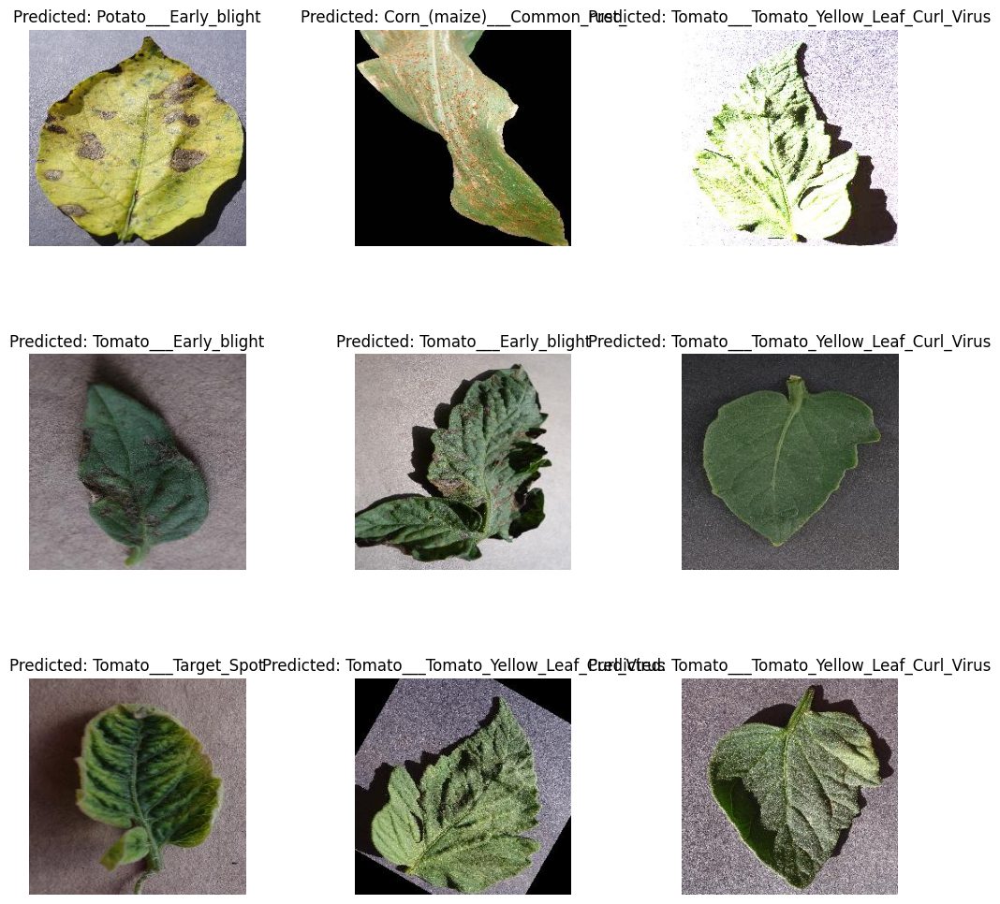

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Display a few predictions with images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i, ax in enumerate(axes.flatten()):
    img_path = test_df.loc[i, 'filename']  # Get the image file path
    img = load_img(img_path, target_size=(256, 256))  # Load and resize the image
    ax.imshow(img)
    ax.set_title(f'Predicted: {predicted_labels[i]}')  # Set title to the predicted label
    ax.axis('off')

plt.show()

## Now randomly picking images from the Web

In [4]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Load the trained model
model_path = '/content/drive/MyDrive/DL Project/best_model.h5'
model = load_model(model_path)

# Specify the path to the new image
image_path = '/content/drive/MyDrive/DL Project/Testing/corn_cm_rt.png'

img = load_img(image_path, target_size=(256, 256))

# Convert the image to an array
img_array = img_to_array(img)

# Normalize the image array
img_array /= 255.0

# Expand dimensions to match the batch size
img_array = np.expand_dims(img_array, axis=0)

# Predict the class of the image
predictions = model.predict(img_array)

# Get the index of the highest probability
predicted_class_index = np.argmax(predictions, axis=1)

# Assuming you have a list of class labels that matches the order of the model's output
class_labels = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']
predicted_class = class_labels[predicted_class_index[0]]

print("Predicted class:", predicted_class)

1/1 [==============================] - 3s 3s/step
Predicted class: Corn_(maize)___Common_rust_
